In [26]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [27]:
import os
import shutil
import PIL
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm
import cv2
from sklearn.cluster import KMeans
from ast import literal_eval

import tensorflow.keras as keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from utils import DominantColors, parallel
from model.data_loader import DataGenerator

In [28]:
def listdir_nohidden(path):
    return [f for f in os.listdir(path) if not f.startswith('.')]

In [29]:
# Source directories
thresholds_datasets = [
    (10, f'./data/raw/nga_painting/'),
    (30, f'./data/raw/nga_textile/'), 
    (20, f'./data/raw/artic_hiroshige/'), 
    (20, f'./data/raw/artic_painting/'), 
    (50, f'./data/raw/artic_textile/'),
    (30, f'./data/raw/artic_paper_fiber/')
] 

In [30]:
# Output directories
path = './data/processed/'
path_csv = f'{path}colors.csv'
path_tgt = f'{path}images/'

# Filter most colorful images and resize

In [8]:
def colourfulness(filepath):
    """
    Calculate a metric representing the colourfulness of an image
    as described here: 
    https://www.pyimagesearch.com/2017/06/05/computing-image-colorfulness-with-opencv-and-python/
    """

    img = cv2.imread(filepath)
    try:
        (B, G, R) = cv2.split(img.astype("float"))
    except:
        # Couldn't load image
        return (0, filepath)
    
    # If image has no colour channels give min score
    if len(img.shape) == 2:
        return (0, filepath)

    # Calulate colourfulness metric
    rg = np.absolute(R - G)
    yb = np.absolute(0.5 * (R+G) - B)
    
    stdRoot  = np.sqrt((np.std(rg) **2) + (np.std(yb) **2))
    meanRoot = np.sqrt((np.std(yb) **2) + (np.mean(yb) **2))
    
    colourfulness = stdRoot + (0.3 * meanRoot)
    return (colourfulness, filepath)


def filt_resize(thresh_filepaths_dest:tuple, index):
    """
    Resize image
    compatible with fastai.core.parallel()
    """
    # Parse out params
    colour_threshold, filepath, dest = thresh_filepaths_dest
    _, filename = os.path.split(filepath)
    
    # Get colourfulness metric for this image
    clflness, _ = colourfulness(filepath)    
    
    # If image is colourful enough then use it
    if clflness > colour_threshold:
        img = PIL.Image.open(filepath)
        targ_sz = resize_to(img, 256, use_min=True)
        img = img.resize(targ_sz, resample=PIL.Image.BILINEAR).convert('RGB')
        img.save(f'{dest}{filename}')
        #print(f'Saved Image: {dest}{filename}')
    return


def show_img(filepath):
    try:
        print(f'Colourfulness: {filepath[0]}')
        img = PIL.Image.open(filepath[1])
        plt.imshow(img)
        plt.show();
    except:
        pass
    return

Colourfulness: 5.824193491159626


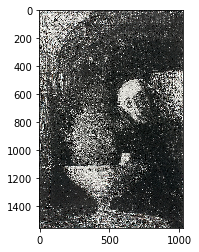

Colourfulness: 6.253394287666316


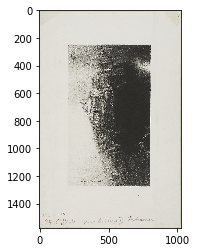

Colourfulness: 6.419392745663458


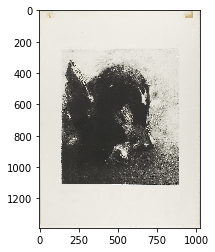

Colourfulness: 6.696860287745523


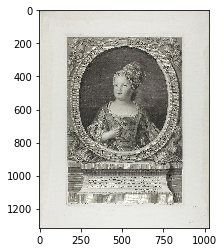

Colourfulness: 6.698947424276609


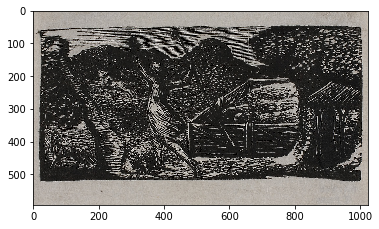

Colourfulness: 7.141588991635011


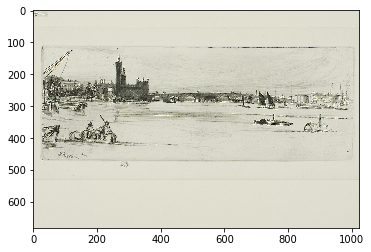

Colourfulness: 7.159140108610405


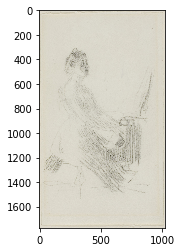

Colourfulness: 7.272295327247616


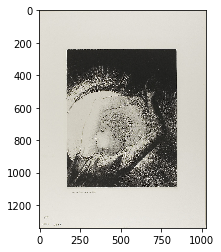

Colourfulness: 7.46464119838485


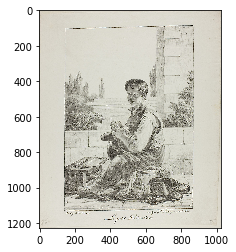

Colourfulness: 8.492234476199622


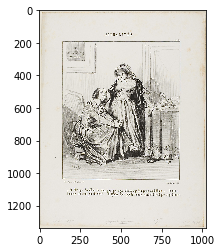

Colourfulness: 8.537899259241481


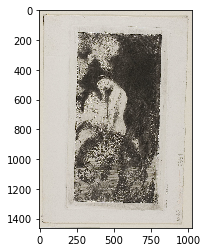

Colourfulness: 8.638088606118735


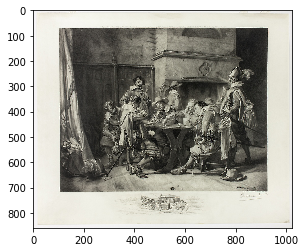

Colourfulness: 8.92841381660397


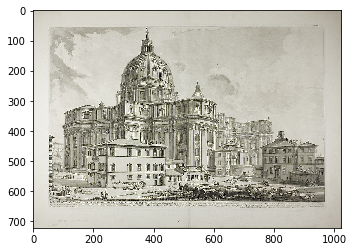

Colourfulness: 8.953859427828945


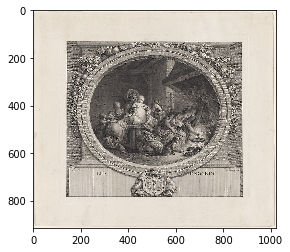

Colourfulness: 9.534155975931839


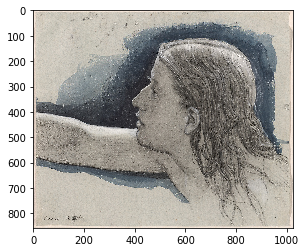

Colourfulness: 9.669278518150525


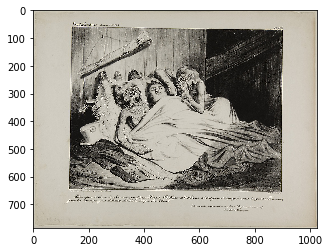

Colourfulness: 9.91953255488222


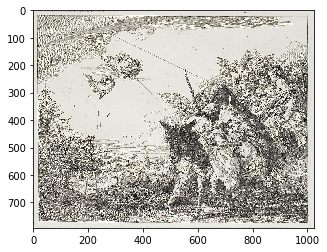

Colourfulness: 10.05287386265826


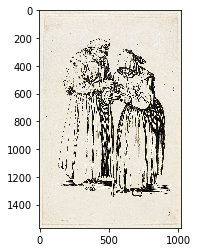

Colourfulness: 10.275635191589757


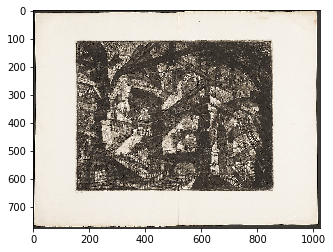

Colourfulness: 10.720372974485034


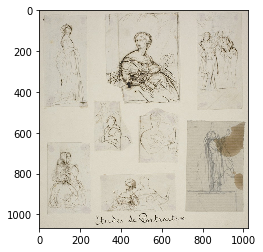

Colourfulness: 10.752190401001087


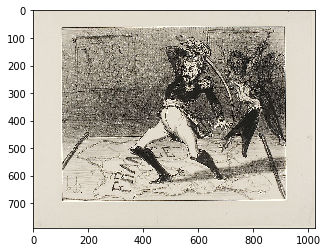

Colourfulness: 10.808446601923851


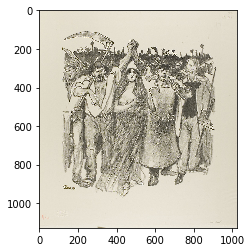

Colourfulness: 11.174106834982442


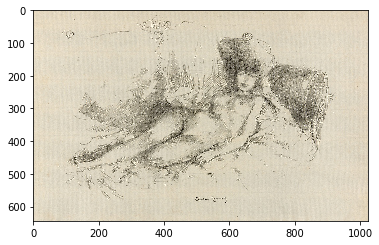

Colourfulness: 11.57461207925566


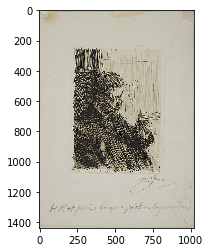

Colourfulness: 11.624068492128666


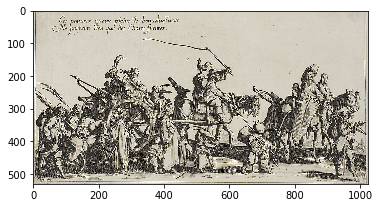

Colourfulness: 11.731118683165496


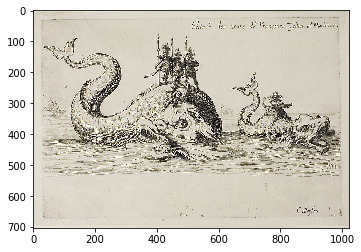

Colourfulness: 11.743098016572015


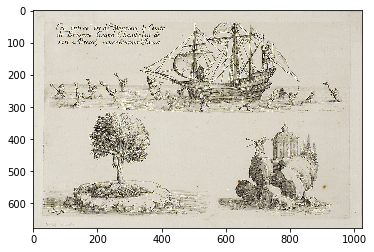

Colourfulness: 11.839893348847445


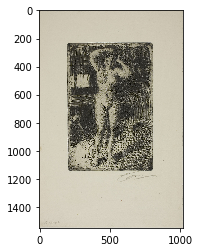

Colourfulness: 12.048396054389116


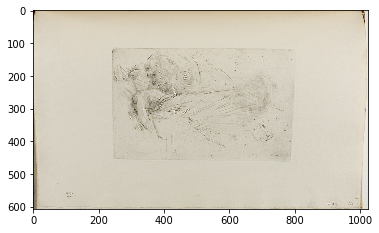

Colourfulness: 12.125432178989385


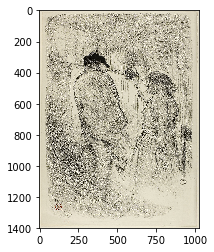

Colourfulness: 12.140586726267532


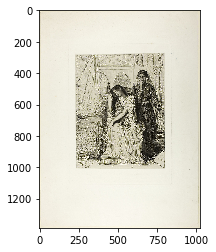

Colourfulness: 12.179772968284766


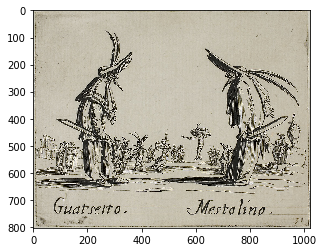

Colourfulness: 12.37867021235471


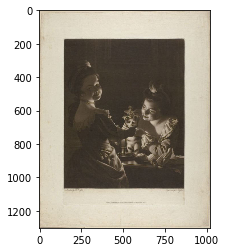

Colourfulness: 12.480708950806436


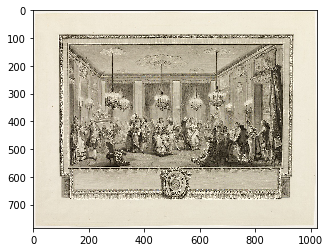

Colourfulness: 12.816777259879123


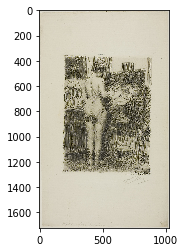

Colourfulness: 12.87954931548559


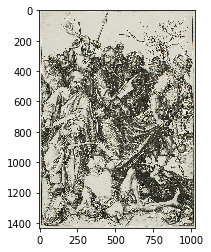

Colourfulness: 12.891084526108285


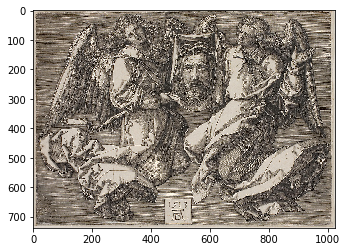

Colourfulness: 13.028552381933952


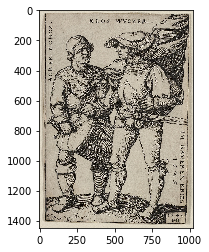

Colourfulness: 13.188658945926473


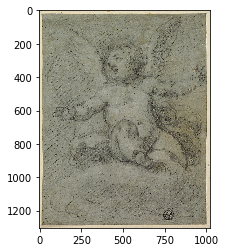

Colourfulness: 13.343178972391346


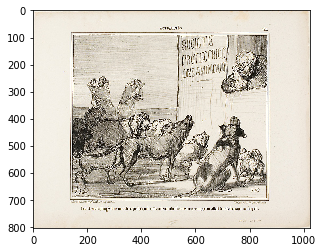

Colourfulness: 13.344324546740417


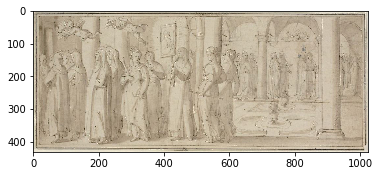

Colourfulness: 13.622156588904915


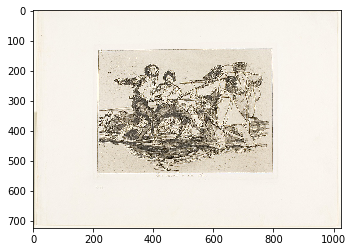

Colourfulness: 13.629092059140824


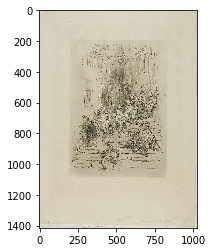

Colourfulness: 14.41002412653377


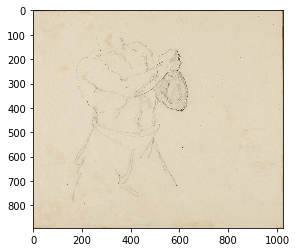

Colourfulness: 14.519493745615785


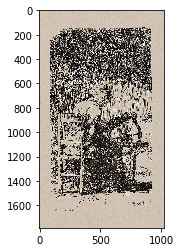

Colourfulness: 14.628086035123493


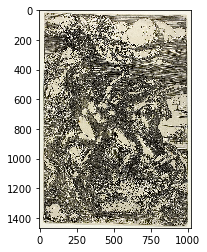

Colourfulness: 14.645728279761013


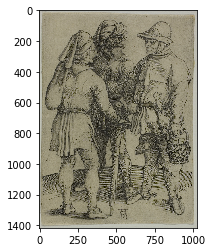

Colourfulness: 14.764615668529654


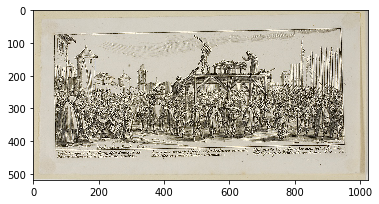

Colourfulness: 14.81351745251768


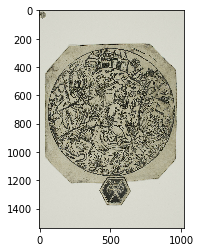

Colourfulness: 14.858722596570527


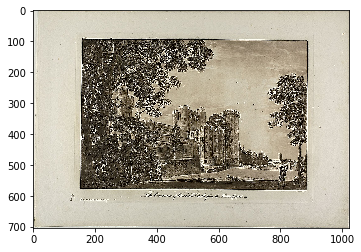

Colourfulness: 14.861265977397249


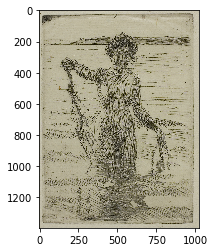

Colourfulness: 15.269344753667923


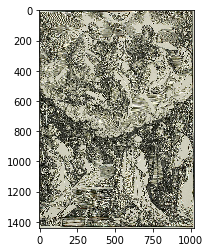

Colourfulness: 15.514222158504605


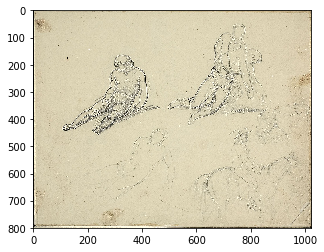

Colourfulness: 15.682003349680034


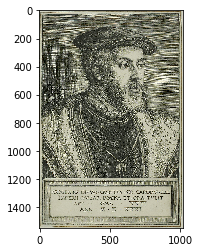

Colourfulness: 15.828769449117008


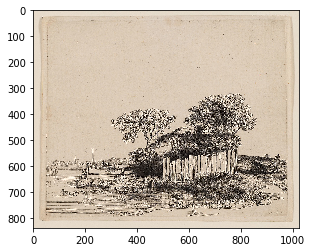

Colourfulness: 15.881114481215427


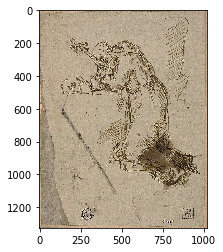

Colourfulness: 15.972398348004637


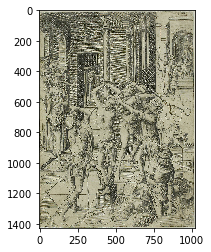

Colourfulness: 16.133122238771303


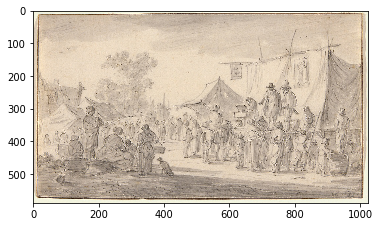

Colourfulness: 16.337441739974405


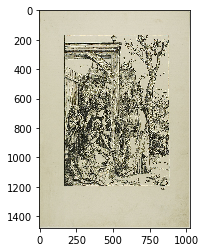

Colourfulness: 16.3415328009007


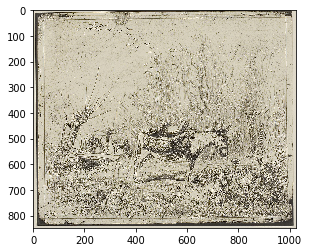

Colourfulness: 16.496780274571403


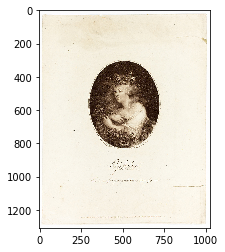

Colourfulness: 17.02351491142466


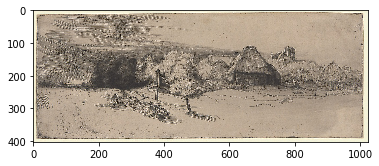

Colourfulness: 17.210440086195298


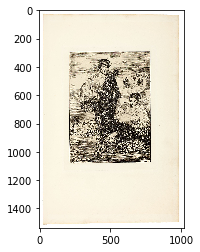

Colourfulness: 17.541298010875977


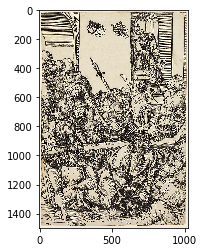

Colourfulness: 17.646541141903953


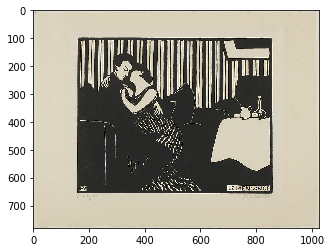

Colourfulness: 17.877063580964947


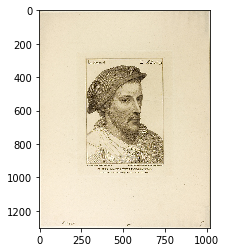

Colourfulness: 18.186137162118733


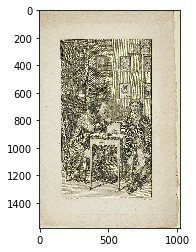

Colourfulness: 18.224085202764073


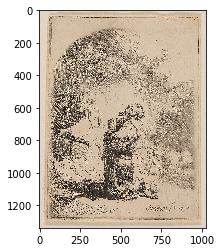

Colourfulness: 18.35619781441489


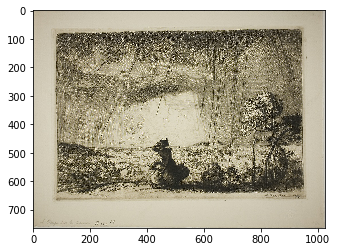

Colourfulness: 18.51243481179923


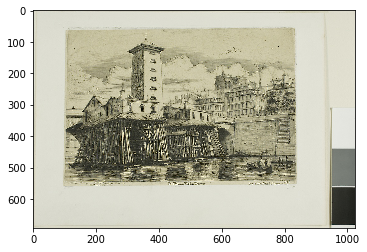

Colourfulness: 18.624740290997188


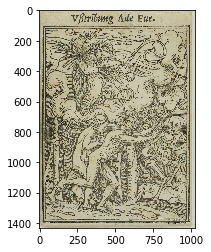

Colourfulness: 18.632699090085634


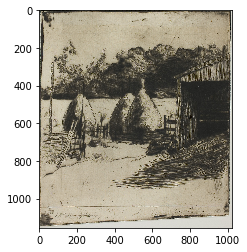

Colourfulness: 18.672897136838174


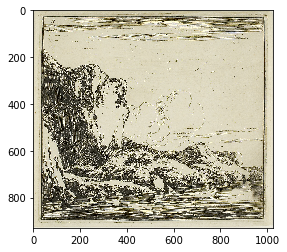

Colourfulness: 18.824341757948037


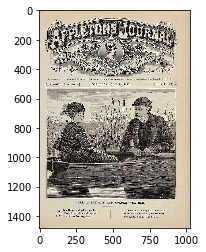

Colourfulness: 19.004648467804376


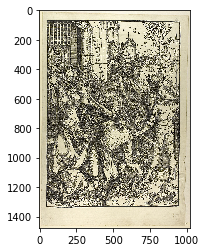

Colourfulness: 19.540398785777796


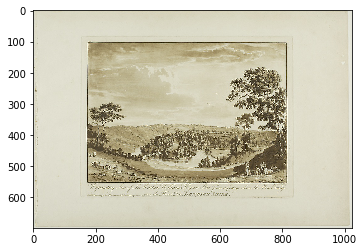

Colourfulness: 19.639833062457797


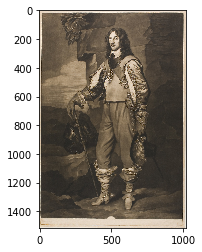

Colourfulness: 20.252491879710984


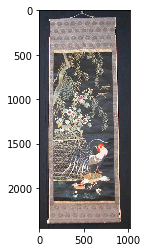

Colourfulness: 20.293150928914


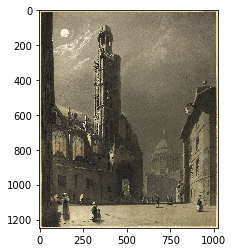

Colourfulness: 20.31841404406376


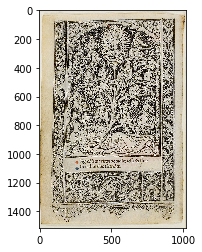

Colourfulness: 20.689936308041958


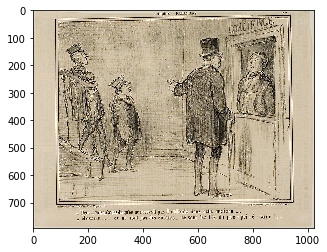

Colourfulness: 20.728675288832676


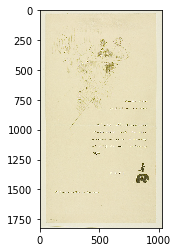

Colourfulness: 21.15934289557257


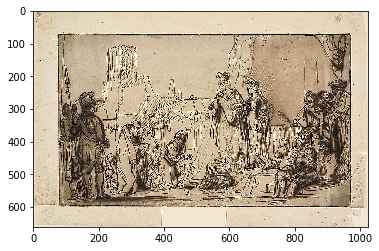

Colourfulness: 23.26797550345524


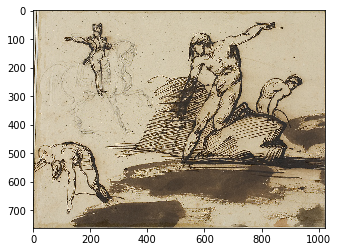

Colourfulness: 24.7666296220639


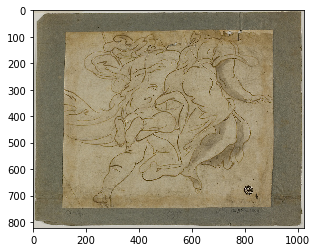

Colourfulness: 25.1186690263282


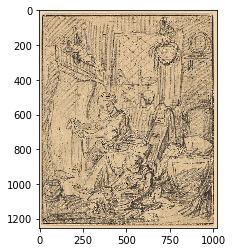

Colourfulness: 25.187413653006526


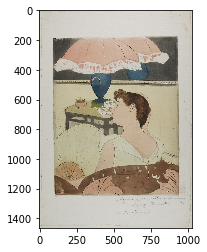

Colourfulness: 25.518359883012845


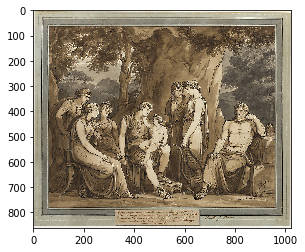

Colourfulness: 26.06180502061066


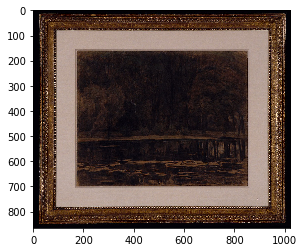

Colourfulness: 26.10796308375897


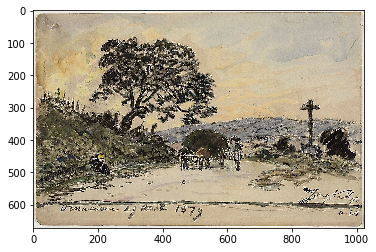

Colourfulness: 26.689464350618252


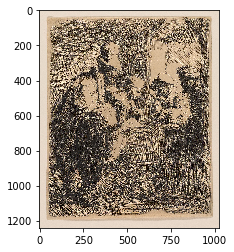

Colourfulness: 27.081569686622046


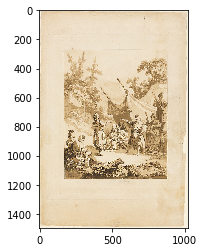

Colourfulness: 27.794017279734227


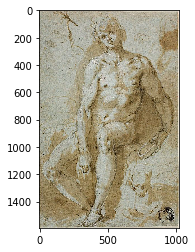

Colourfulness: 32.59788304933174


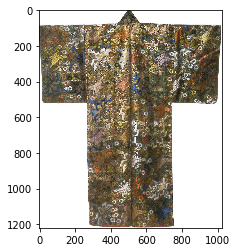

Colourfulness: 37.83417934580326


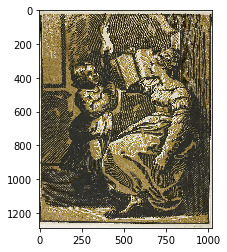

Colourfulness: 40.00185946870374


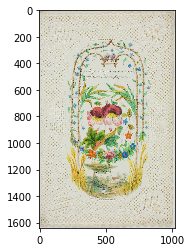

Colourfulness: 41.70871943850368


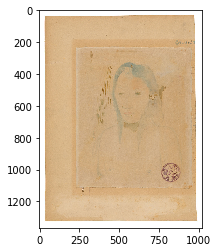

Colourfulness: 44.39372193820459


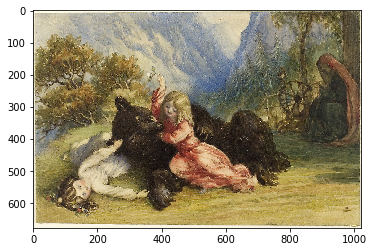

Colourfulness: 45.60372566274977


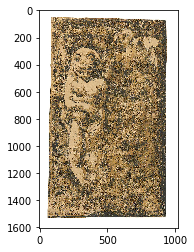

Colourfulness: 46.71892595314718


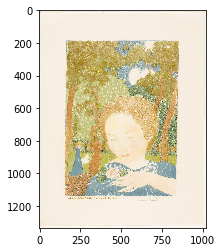

In [111]:
# Choose color threshold
# Shows a sample of images sorted by colorfulness

src_dir = thresholds_datasets[0][1]
filenames = listdir_nohidden(src_dir)
filepaths = [f'{src_dir}{f}' for f in filenames[0:100]]
cf_scores = [colourfulness(f) for f in filepaths]
cf_scores.sort()

for im in cf_scores:
    show_img(im)

In [ ]:
# Collate datasources, filter only colourful examples, and resize
for ds in thresholds_datasets:
    colour_thresh, directory = ds
    filenames = listdir_nohidden(directory)
    thresh_filepaths_dest = [(colour_thresh, f'{directory}{f}', path_tgt) for f in filenames]
    # TODO: remove fastai dependency here
    parallel(filt_resize, thresh_filepaths_dest)

# Extract dominant colors

Record dominant colors for each image in a CSV. This takes 5 hours 40 mins to run for ~8901 images on paperspace P4000 instance.

In [11]:
domcolors = DominantColors(k=5)
filenames = listdir_nohidden(path_tgt)
filepaths = [f'{path_tgt}{f}' for f in filenames]

In [12]:
domcolors.analyse_batch(filepaths, path_csv, chunksize=1)
domcolors.to_csv(path_csv)

Error processing: 000602054-R232702006-1.jpg
The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error recording: 000602054-R232702006-1.jpg
Error processing: 000583757-R203540006-4.jpg
The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()
Error recording: 000583757-R203540006-4.jpg


# Dataloader demo

In [31]:
colors_df = pd.read_csv(path_csv, index_col='filename')

# Parameters
params = {'dim': (256,256),
          'batch_size': 32,
          'n_channels': 3,
          'shuffle': True}

# Datasets
ids = list(colors_df.index)
partition = {'train': ids[:3000], 'valid': ids[3000:]}
labels = {i: 0 for i in ids}

# Generators
training_generator = DataGenerator(partition['train'], labels, path_csv,**params)

n_batches: 278


In [32]:
batch = training_generator.__getitem__(0)

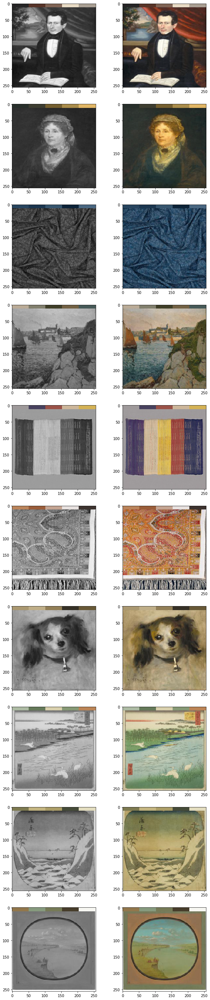

In [25]:
rows = 10
f, axarr = plt.subplots(rows, 2, figsize=(10, 5*rows))

for row in range(rows):
    src = (batch[0][row, :, :, :] +1)*127.5 /255
    tgt = (batch[1][row, :, :, :] +1)*127.5 /255
    axarr[row,0].imshow(src)
    axarr[row,1].imshow(tgt)

In [35]:
# Note: this data loader returns channels last

batch[1][0, :, :, :].shape

(256, 256, 3)